# U-Net 03 - Inferencia

Genera rasters continuos de probabilidad `*_prob.tif`. La binarizacion se hace despues en vectorizacion, usando el threshold del checkpoint.
El notebook lista primero los `.tif` disponibles en `data/validation` y permite seleccionar por `idx` o por `stem` antes de correr.


In [11]:
from pathlib import Path
import sys

ROOT = Path.cwd().parent if Path.cwd().name == 'notebooks' else Path.cwd()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))
print(f'ROOT = {ROOT}')

ROOT = /Users/snojekba/Documents/11_Rodalizacion_automatica


In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio
from rasterio.windows import Window

from src.rodal_config import VALIDATION_DIR, MODEL_DIR, PRED_DIR, OUTPUTS_DIR, DEFAULT_TILE_SIZE, DEFAULT_OVERLAP, ensure_dirs
from src.rodal_model import load_checkpoint, checkpoint_stats
from src.rodal_inference import infer_tiled, write_probability_tif
from src.rodal_bands import band_map

ensure_dirs()
MODEL_RUN_NAME = 'v128_final_aug2026_jaccard'
MODEL_RUN_DIR = MODEL_DIR.parent / f'02_modelo_{MODEL_RUN_NAME}'
MODEL_PATH = MODEL_RUN_DIR / 'unet_rodalizacion.pth'
ckpt, model, device = load_checkpoint(MODEL_PATH)
MEAN, STD, THRESHOLD = checkpoint_stats(ckpt)
print(f'Modelo={MODEL_PATH}')
print(f'Device={device} | epoch={ckpt["epoch"]} | val_iou={ckpt["val_iou"]:.3f} | threshold={THRESHOLD:.2f}')
print('MEAN:', np.round(MEAN, 2))
print('STD :', np.round(STD, 2))
print('Input contract:', ckpt.get('input_contract', 'legacy_raw_raster_values'))
print('Band order:', ckpt.get('band_order', 'no registrado'))

Modelo=/Users/snojekba/Documents/11_Rodalizacion_automatica/pipeline/unet/02_modelo_v128_final_aug2026_jaccard/unet_rodalizacion.pth
Device=mps | epoch=72 | val_iou=0.827 | threshold=0.40
MEAN: [147.97 130.6   99.04 275.03]
STD : [ 35.05  36.46  39.1  104.69]
Input contract: raw_raster_values_channel_last_no_normalization
Band order: BGRNIR


In [13]:
BAND_ORDER = 'BGRNIR'

# Modelo entrenado con tiles 128. Con overlap 96, stride=32: mas promedio y bordes mas suaves.
BASE_COMPARE_RUN_NAME = None  # usar un nombre de run si queres comparar contra una inferencia anterior
PRED_RUN_NAME = 'v128_final_aug2026_jaccard_stride32'
PRED_RUN_DIR = PRED_DIR / PRED_RUN_NAME
PRED_RUN_DIR.mkdir(parents=True, exist_ok=True)
TILE_SIZE = 128
OVERLAP = 96

# Carpeta donde estan las imagenes a inferir. Por defecto: data/validation.
INFERENCE_DIR = VALIDATION_DIR
ALL_INFERENCE_IMAGES = sorted(INFERENCE_DIR.glob('*.tif'))
if not ALL_INFERENCE_IMAGES:
    raise FileNotFoundError(f'No encontre .tif en {INFERENCE_DIR}')

rows = []
for idx, path in enumerate(ALL_INFERENCE_IMAGES):
    with rasterio.open(path) as src:
        rows.append({
            'idx': idx,
            'stem': path.stem,
            'archivo': path.name,
            'width': src.width,
            'height': src.height,
            'bands': src.count,
            'dtype': src.dtypes[0],
            'res_m': round(abs(src.transform.a), 3),
            'crs': str(src.crs),
            'size_mb': round(path.stat().st_size / 1024 / 1024, 1),
            'ok_bandas': src.count == len(MEAN),
        })

images_df = pd.DataFrame(rows)
display(images_df)
print(f'Imagenes disponibles en {INFERENCE_DIR}: {len(ALL_INFERENCE_IMAGES)}')
print(f'El modelo espera {len(MEAN)} bandas. ok_bandas debe ser True para inferir.')

# Elegir imagenes a correr:
# - Dejar ambos vacios para correr todas.
# - Usar indices de la tabla: SELECTED_IMAGE_IDS = [0, 3]
# - O usar nombres sin .tif: SELECTED_IMAGE_STEMS = ['campo_val1', 'campo_val5']
SELECTED_IMAGE_IDS = []
SELECTED_IMAGE_STEMS = []

if SELECTED_IMAGE_STEMS:
    wanted = set(SELECTED_IMAGE_STEMS)
    VAL_IMAGES = [p for p in ALL_INFERENCE_IMAGES if p.stem in wanted]
    missing = sorted(wanted - {p.stem for p in VAL_IMAGES})
    if missing:
        raise ValueError(f'No encontre estas imagenes en {INFERENCE_DIR}: {missing}')
elif SELECTED_IMAGE_IDS:
    bad = [i for i in SELECTED_IMAGE_IDS if i < 0 or i >= len(ALL_INFERENCE_IMAGES)]
    if bad:
        raise ValueError(f'Indices fuera de rango: {bad}. Ver columna idx en la tabla.')
    VAL_IMAGES = [ALL_INFERENCE_IMAGES[i] for i in SELECTED_IMAGE_IDS]
else:
    VAL_IMAGES = ALL_INFERENCE_IMAGES

print(f'Run inferencia: {PRED_RUN_NAME} | tile={TILE_SIZE} | overlap={OVERLAP} | stride={TILE_SIZE - OVERLAP}')
print(f"Comparacion base: {BASE_COMPARE_RUN_NAME or 'sin base'}")
print(f'Salida: {PRED_RUN_DIR}')
print(f'Imagenes seleccionadas: {len(VAL_IMAGES)}')
for path in VAL_IMAGES:
    row = images_df.loc[images_df.stem == path.stem].iloc[0]
    print(f"  [{int(row.idx)}] {path.name}: {int(row.width):,}x{int(row.height):,} bands={int(row.bands)} dtype={row.dtype} res={row.res_m:.2f}m")


,idx,stem,archivo,width,height,bands,dtype,res_m,crs,size_mb,ok_bandas
0,0,campo_val1,campo_val1.tif,5447,4088,4,uint16,0.5,EPSG:32721,169.9,True
1,1,campo_val2,campo_val2.tif,5314,3987,4,uint16,0.5,EPSG:32721,161.7,True
2,2,campo_val3,campo_val3.tif,5458,3541,4,uint16,0.5,EPSG:32721,147.5,True
3,3,campo_val4,campo_val4.tif,7299,5477,4,uint16,0.5,EPSG:32721,305.1,True
4,4,campo_val5,campo_val5.tif,3651,2369,4,uint16,0.5,EPSG:32721,66.0,True
5,5,campo_val6,campo_val6.tif,4532,2940,4,uint16,0.5,EPSG:32721,101.7,True
6,6,campo_val7,campo_val7.tif,4896,3176,4,uint16,0.5,EPSG:32721,118.7,True
7,7,campo_val8,campo_val8.tif,7699,4995,4,uint16,0.5,EPSG:32721,293.5,True


Imagenes disponibles en /Users/snojekba/Documents/11_Rodalizacion_automatica/data/validation: 8
El modelo espera 4 bandas. ok_bandas debe ser True para inferir.
Run inferencia: v128_final_aug2026_jaccard_stride32 | tile=128 | overlap=96 | stride=32
Comparacion base: sin base
Salida: /Users/snojekba/Documents/11_Rodalizacion_automatica/pipeline/unet/03_predicciones/v128_final_aug2026_jaccard_stride32
Imagenes seleccionadas: 8
  [0] campo_val1.tif: 5,447x4,088 bands=4 dtype=object res=0.50m
  [1] campo_val2.tif: 5,314x3,987 bands=4 dtype=object res=0.50m
  [2] campo_val3.tif: 5,458x3,541 bands=4 dtype=object res=0.50m
  [3] campo_val4.tif: 7,299x5,477 bands=4 dtype=object res=0.50m
  [4] campo_val5.tif: 3,651x2,369 bands=4 dtype=object res=0.50m
  [5] campo_val6.tif: 4,532x2,940 bands=4 dtype=object res=0.50m
  [6] campo_val7.tif: 4,896x3,176 bands=4 dtype=object res=0.50m
  [7] campo_val8.tif: 7,699x4,995 bands=4 dtype=object res=0.50m


In [14]:
results = []
for tif_path in VAL_IMAGES:
    print(f'\n=== {tif_path.stem} ===')
    with rasterio.open(tif_path) as src:
        if src.count != len(MEAN):
            raise ValueError(f'{tif_path.name}: tiene {src.count} bandas, pero el modelo espera {len(MEAN)}.')
    prob, transform, crs = infer_tiled(
        tif_path,
        model,
        MEAN,
        STD,
        device,
        tile_size=TILE_SIZE,
        overlap=OVERLAP,
    )
    out_path = PRED_RUN_DIR / f'{tif_path.stem}_prob.tif'
    write_probability_tif(out_path, prob, transform, crs)
    area_ha = float((prob >= THRESHOLD).sum()) * abs(transform.a * transform.e) / 10_000
    print(f'  Guardado: {out_path.name}')
    print(f'  Area preliminar p>={THRESHOLD:.2f}: {area_ha:.1f} ha')
    results.append((tif_path, prob, transform))


=== campo_val1 ===
  21000 tiles procesados          
  Guardado: campo_val1_prob.tif
  Area preliminar p>=0.40: 120.2 ha

=== campo_val2 ===
  20008 tiles procesados          
  Guardado: campo_val2_prob.tif
  Area preliminar p>=0.40: 127.0 ha

=== campo_val3 ===
  18144 tiles procesados          
  Guardado: campo_val3_prob.tif
  Area preliminar p>=0.40: 173.2 ha

=== campo_val4 ===
  38194 tiles procesados          
  Guardado: campo_val4_prob.tif
  Area preliminar p>=0.40: 175.4 ha

=== campo_val5 ===
  8064 tiles procesados          
  Guardado: campo_val5_prob.tif
  Area preliminar p>=0.40: 83.9 ha

=== campo_val6 ===
  12371 tiles procesados          
  Guardado: campo_val6_prob.tif
  Area preliminar p>=0.40: 110.7 ha

=== campo_val7 ===
  14550 tiles procesados          
  Guardado: campo_val7_prob.tif
  Area preliminar p>=0.40: 166.9 ha

=== campo_val8 ===
  36652 tiles procesados          
  Guardado: campo_val8_prob.tif
  Area preliminar p>=0.40: 541.4 ha


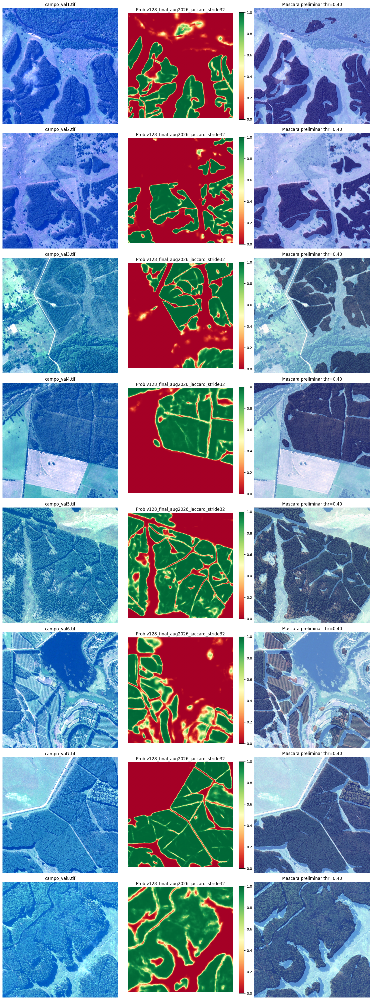

In [15]:
# QA visual compacta, con comparacion contra el run base si existe.
P = 1800
bm = band_map(BAND_ORDER)
base_dir = PRED_DIR / BASE_COMPARE_RUN_NAME if BASE_COMPARE_RUN_NAME else None
has_base = bool(base_dir) and any((base_dir / f'{tif_path.stem}_prob.tif').exists() for tif_path, _, _ in results)
ncols = 5 if has_base else 3
fig, axes = plt.subplots(len(results), ncols, figsize=(5 * ncols, 5 * len(results)))
if len(results) == 1:
    axes = axes.reshape(1, ncols)

for row, (tif_path, prob, transform) in enumerate(results):
    h, w = prob.shape
    y0 = max(h // 2 - P // 2, 0); x0 = max(w // 2 - P // 2, 0)
    y1 = min(y0 + P, h); x1 = min(x0 + P, w)
    with rasterio.open(tif_path) as src:
        rgb = src.read([bm.red, bm.green, bm.blue], window=Window(x0, y0, x1-x0, y1-y0)).transpose(1, 2, 0).astype(np.float32)
    valid = rgb[:, :, 0] > 0
    p2, p98 = np.percentile(rgb[valid], [2, 98]) if valid.any() else (0, 1)
    rgb = np.clip((rgb - p2) / max(p98 - p2, 1), 0, 1)
    pc = prob[y0:y1, x0:x1]

    col = 0
    axes[row, col].imshow(rgb)
    axes[row, col].set_title(tif_path.name)
    axes[row, col].axis('off')
    col += 1

    if has_base:
        base_path = base_dir / f'{tif_path.stem}_prob.tif'
        if base_path.exists():
            with rasterio.open(base_path) as src:
                base_prob = src.read(1).astype(np.float32)
            bc = base_prob[y0:y1, x0:x1]
            im = axes[row, col].imshow(bc, cmap='RdYlGn', vmin=0, vmax=1)
            axes[row, col].set_title(f'Prob base {BASE_COMPARE_RUN_NAME}')
            axes[row, col].axis('off')
            plt.colorbar(im, ax=axes[row, col], fraction=0.046)
            col += 1

            im = axes[row, col].imshow(pc - bc, cmap='coolwarm', vmin=-0.35, vmax=0.35)
            axes[row, col].set_title(f'Delta {PRED_RUN_NAME} - base')
            axes[row, col].axis('off')
            plt.colorbar(im, ax=axes[row, col], fraction=0.046)
            col += 1
        else:
            axes[row, col].imshow(np.zeros_like(pc), cmap='gray')
            axes[row, col].set_title('Sin base')
            axes[row, col].axis('off')
            col += 2

    im = axes[row, col].imshow(pc, cmap='RdYlGn', vmin=0, vmax=1)
    axes[row, col].set_title(f'Prob {PRED_RUN_NAME}')
    axes[row, col].axis('off')
    plt.colorbar(im, ax=axes[row, col], fraction=0.046)
    col += 1

    axes[row, col].imshow(rgb)
    axes[row, col].imshow(pc >= THRESHOLD, cmap='Reds', alpha=0.35)
    axes[row, col].set_title(f'Mascara preliminar thr={THRESHOLD:.2f}')
    axes[row, col].axis('off')

plt.tight_layout()
plt.savefig(OUTPUTS_DIR / f'unet_03_inferencia_qa_{PRED_RUN_NAME}.png', dpi=130, bbox_inches='tight')
plt.show()

Siguiente notebook: `unet_04b_poligonizar_simple.ipynb`.
